In [7]:
import numpy as np
import cv2
import glob 
import matplotlib.pyplot as plt
import pickle

%matplotlib inline 

## Camera Calibration

Loading images and looking for corners on chessboard:

In [8]:
objpoints = [] #3D points in real world
imgpoints = [] #2D points in image plane

nx = 9
ny = 6

#Prepare object points like (0, 0, 0), (1, 0, 0), ..., (nx-1, ny-1, 0)
objp = np.zeros((nx*ny, 3), np.float32)
objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1, 2)

#Load images
images_name = glob.glob('camera_cal/calibration*.jpg')

for filename in images_name:
    
    img = cv2.imread(filename)
    #Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    #Look for chessboard and return if it was found and the corners
    found, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
    
    if found:
        #Append objp and corners 
        objpoints.append(objp)
        imgpoints.append(corners)
        cv2.drawChessboardCorners(gray, (nx, ny), corners, found)     
        #plt.imshow(gray, cmap='gray')
        #plt.show()

Calibrating test image and undistorting it:

In [9]:
#Read test image
img = cv2.imread('camera_cal/test.jpg')

img_size = (img.shape[1], img.shape[0])

found, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints,
                                                     img_size, None, None)

dst = cv2.undistort(img, mtx, dist, None, mtx)
cv2.imwrite('camera_cal/test_undist.jpg', dst)

#Save the camera calibration result for later use
dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
pickle.dump(dist_pickle, open("camera_cal/wide_dist_pickle.p", "wb"))

Text(0.5,1,'Undistorted Image')

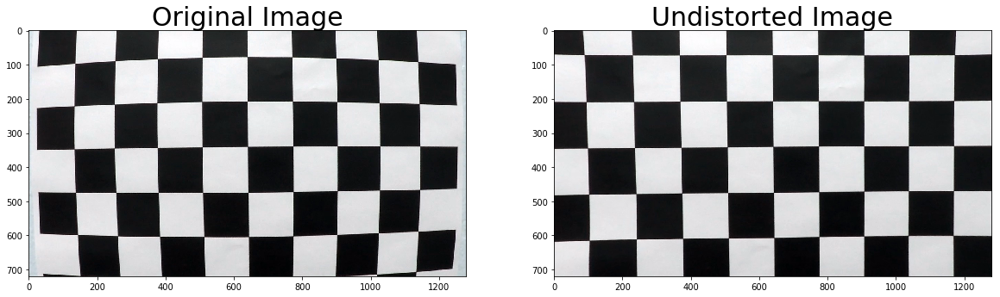

In [10]:
#Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=30)    

## Undistort test images

In [35]:
undistort_pickle = []
with (open("camera_cal/wide_dist_pickle.p", "rb")) as openfile:
    while True:
        try:
            undistort_pickle.append(pickle.load(openfile))
        except EOFError:
            break
            
saved_dist = undistort_pickle[0]["dist"]
saved_mtx = undistort_pickle[0]["mtx"]

In [36]:
test_images_names = glob.glob('test_images/test*.jpg')
i = 0

for filename in test_images_names:
    
    img = cv2.imread(filename)
    
    dst = cv2.undistort(img, saved_mtx, saved_dist, None, saved_mtx)

    i += 1
    cv2.imwrite('test_images/undist'+str(i)+'.jpg', dst)

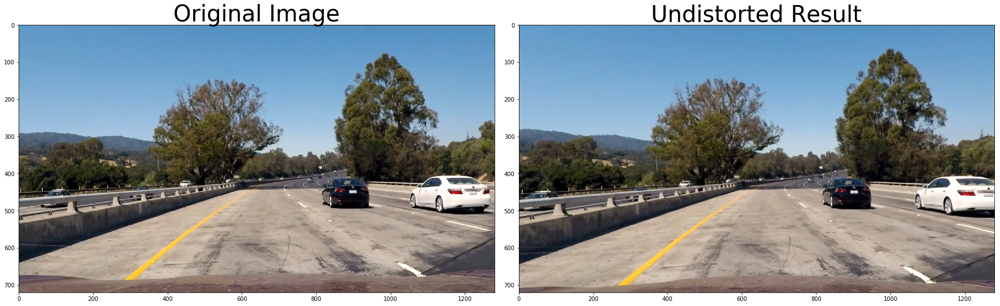

In [41]:
#Show undistortion
example_image = cv2.imread('test_images/test1.jpg')
example_image = cv2.cvtColor(example_image, cv2.COLOR_BGR2RGB)

undistorted_image = cv2.imread('test_images/undist13.jpg')
undistorted_image = cv2.cvtColor(undistorted_image, cv2.COLOR_BGR2RGB)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(example_image)
ax1.set_title('Original Image', fontsize=40)
ax2.imshow(undistorted_image)
ax2.set_title('Undistorted Result', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

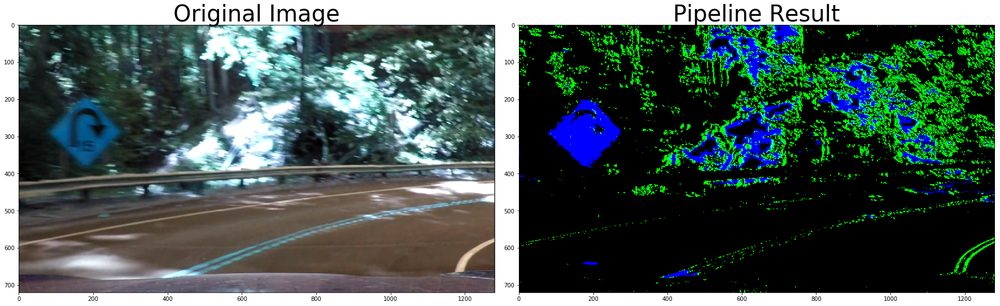

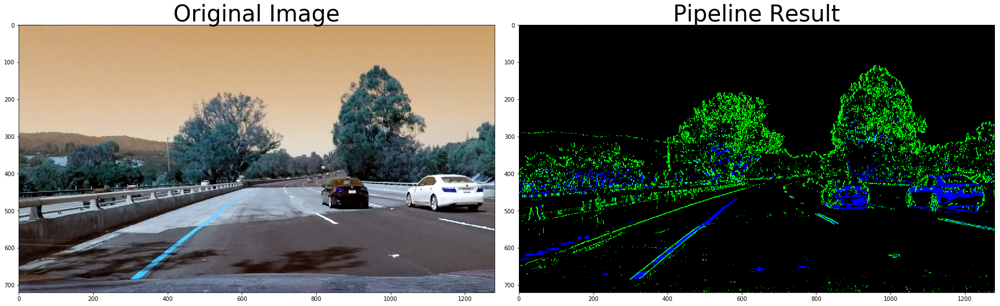

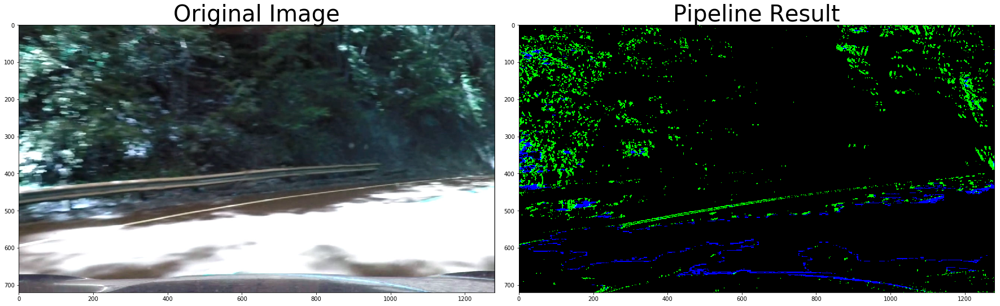

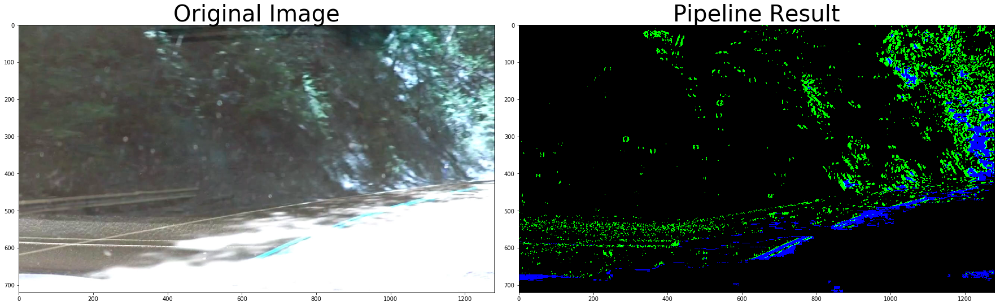

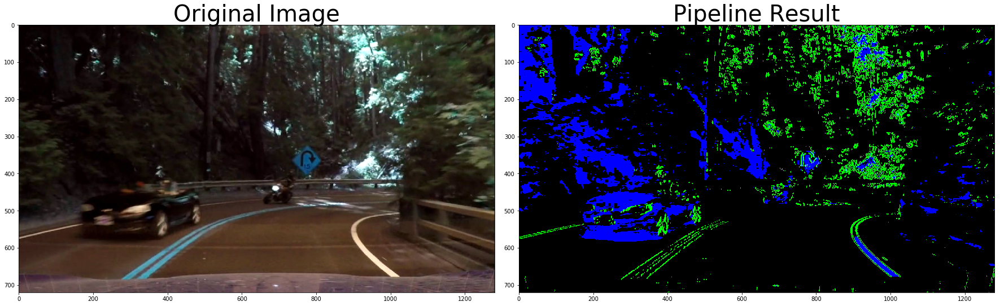

...

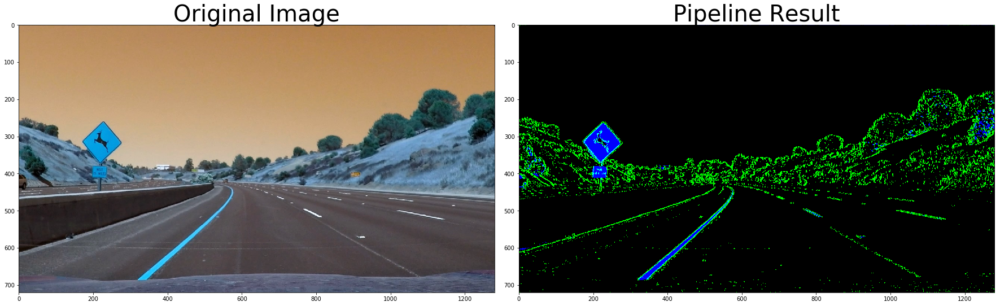

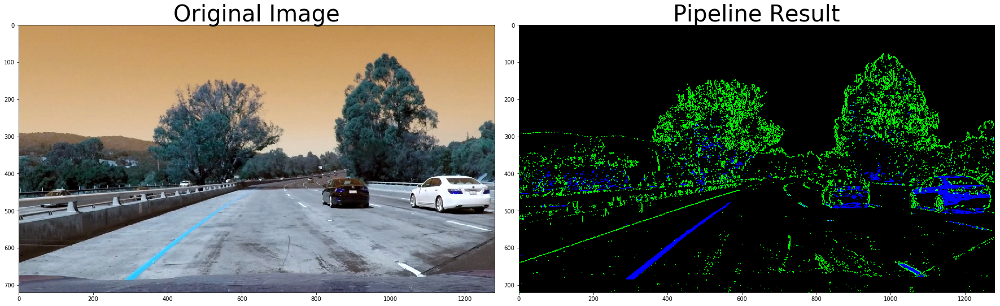

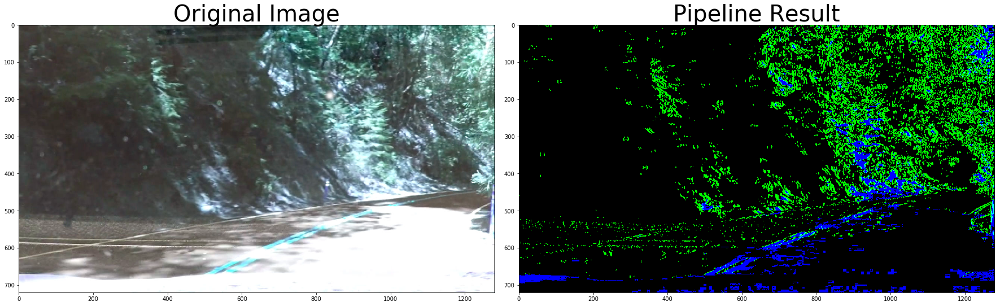

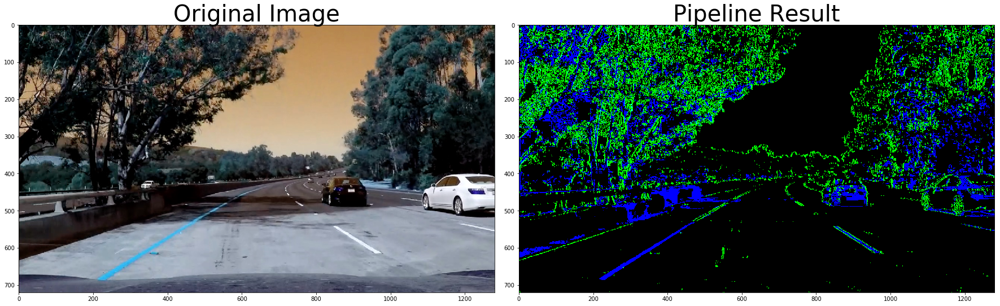

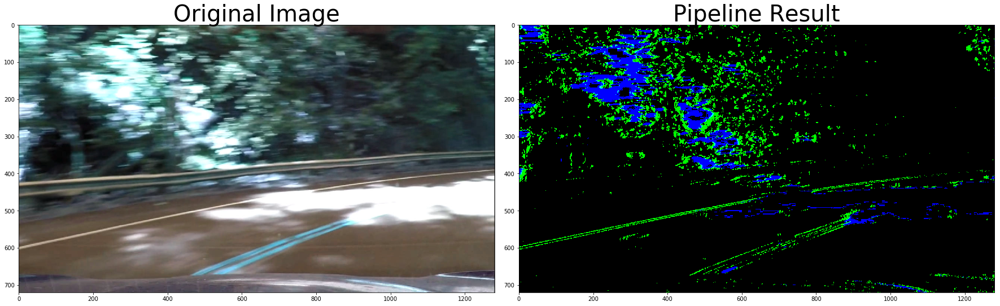

In [33]:
test_images_names = glob.glob('test_images/test*.jpg')

for filename in test_images_names:
    
    image = cv2.imread(filename)
    
    
    result = pipeline(image)

    # Plot the result
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()

    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize=40)

    ax2.imshow(result)
    ax2.set_title('Pipeline Result', fontsize=40)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [30]:
def pipeline(img, s_thresh=(170, 255), sx_thresh=(20, 100)):
    img = np.copy(img)
    # Convert to HLS color space and separate the V channel
    hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    # Sobel x
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    # Stack each channel
    color_binary = np.dstack((np.zeros_like(sxbinary), sxbinary, s_binary)) * 255
    return color_binary